In [6]:
# install modules
import sys
!{sys.executable} -m pip install numpy
!{sys.executable} -m pip install seaborn
!{sys.executable} -m pip install plotly
!{sys.executable} -m pip install matplotlib
!{sys.executable} -m pip install scikit-learn
!{sys.executable} -m pip install pandas

In [1]:
# import libraries
import numpy as np
import seaborn as sb
import plotly as ply
import matplotlib.pyplot as plt
import sklearn as skl
import pandas as pd

In [31]:
# import csv file
breast_data = pd.read_csv("brca.csv")

In [32]:
breast_data = breast_data.drop(columns=["Unnamed: 0"])

In [7]:
# one-hot encoding of y
breast_y_ohc = pd.get_dummies(breast_data["y"])
print(breast_y_ohc)

         B      M
0     True  False
1     True  False
2     True  False
3     True  False
4     True  False
..     ...    ...
564  False   True
565  False   True
566  False   True
567  False   True
568  False   True

[569 rows x 2 columns]


In [33]:
from sklearn.preprocessing import LabelEncoder

breast_y_encoded = LabelEncoder().fit_transform(breast_data["y"])
breast_y_encoded = pd.DataFrame({'is_malignant': breast_y_encoded})
breast_y_encoded

,is_malignant
0,0
1,0
2,0
3,0
4,0
...,...
564,1
565,1
566,1
567,1


In [34]:
breast_data = breast_data.join(breast_y_encoded)
breast_data = breast_data.drop(columns=["y"])
breast_data.head()

,x.radius_mean,x.texture_mean,x.perimeter_mean,x.area_mean,x.smoothness_mean,x.compactness_mean,x.concavity_mean,x.concave_pts_mean,x.symmetry_mean,x.fractal_dim_mean,...,x.texture_worst,x.perimeter_worst,x.area_worst,x.smoothness_worst,x.compactness_worst,x.concavity_worst,x.concave_pts_worst,x.symmetry_worst,x.fractal_dim_worst,is_malignant
0,13.540,14.36,87.46,566.3,0.09779,0.08129,0.06664,0.047810,0.1885,0.05766,...,19.26,99.70,711.2,0.14400,0.17730,0.23900,0.12880,0.2977,0.07259,0
1,13.080,15.71,85.63,520.0,0.10750,0.12700,0.04568,0.031100,0.1967,0.06811,...,20.49,96.09,630.5,0.13120,0.27760,0.18900,0.07283,0.3184,0.08183,0
2,9.504,12.44,60.34,273.9,0.10240,0.06492,0.02956,0.020760,0.1815,0.06905,...,15.66,65.13,314.9,0.13240,0.11480,0.08867,0.06227,0.2450,0.07773,0
3,13.030,18.42,82.61,523.8,0.08983,0.03766,0.02562,0.029230,0.1467,0.05863,...,22.81,84.46,545.9,0.09701,0.04619,0.04833,0.05013,0.1987,0.06169,0
4,8.196,16.84,51.71,201.9,0.08600,0.05943,0.01588,0.005917,0.1769,0.06503,...,21.96,57.26,242.2,0.12970,0.13570,0.06880,0.02564,0.3105,0.07409,0


In [35]:
# normalize data
from sklearn.preprocessing import minmax_scale

bd_norm = minmax_scale(breast_data)
bd_norm = pd.DataFrame(data=bd_norm, columns=breast_data.columns)
print(bd_norm)

     x.radius_mean  x.texture_mean  x.perimeter_mean  x.area_mean  \
0         0.310426        0.157254          0.301776     0.179343   
1         0.288655        0.202908          0.289130     0.159703   
2         0.119409        0.092323          0.114367     0.055313   
3         0.286289        0.294555          0.268261     0.161315   
4         0.057504        0.241123          0.054730     0.024772   
..             ...             ...               ...          ...   
564       0.659709        0.520122          0.685578     0.510498   
565       0.690000        0.428813          0.678668     0.566490   
566       0.622320        0.626987          0.604036     0.474019   
567       0.455251        0.621238          0.445788     0.303118   
568       0.644564        0.663510          0.665538     0.475716   

     x.smoothness_mean  x.compactness_mean  x.concavity_mean  \
0             0.407692            0.189896          0.156139   
1             0.495351            0.330102 

In [41]:
bd_norm.items()

<generator object DataFrame.items at 0x0000024E8C191C60>

C:\Users\ethch\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\ethch\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\ethch\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\ethch\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

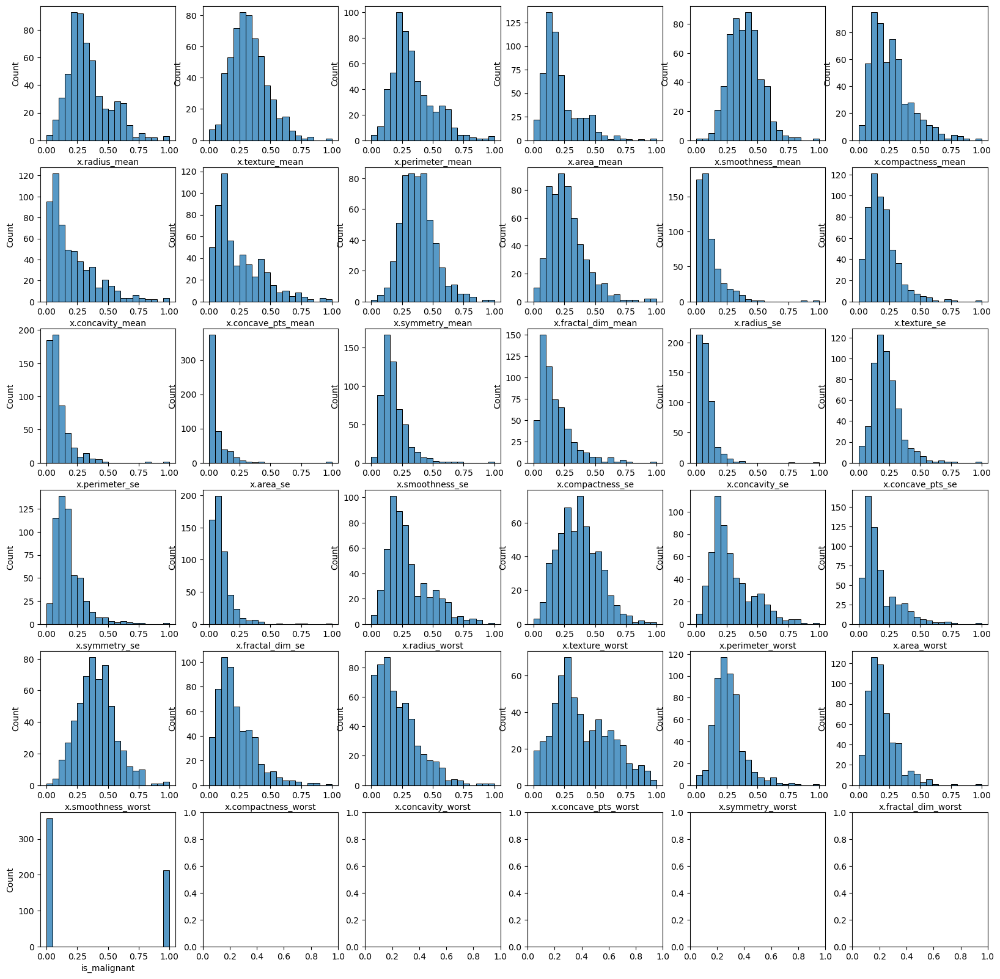

In [55]:
# plot distributions of data
num_rows = 6
num_cols = 6
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20,20))

itr = 0
for label, content in bd_norm.items():
    row = itr // num_cols
    col = itr % num_rows
    sb.histplot(data=bd_norm, x=label, ax=axes[row, col], bins=20, label=label)
    itr += 1

plt.savefig('whole_data_dist.png')
plt.show()

C:\Users\ethch\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\ethch\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\ethch\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\ethch\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

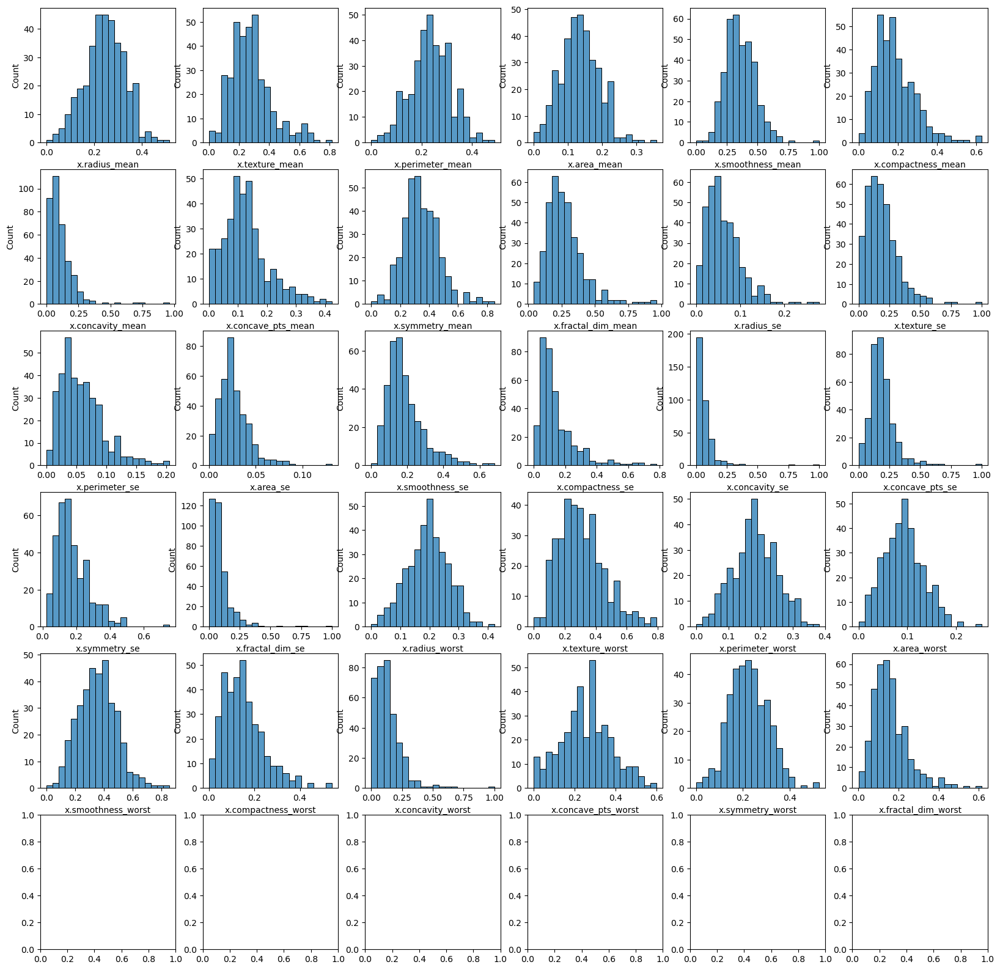

In [56]:
# plot benign data's distributions
num_rows = 6
num_cols = 6
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20,20))

benign_data = bd_norm[bd_norm['is_malignant'] == 0]
benign_data = benign_data.drop(columns=['is_malignant'])

itr = 0
for label, content in benign_data.items():
    row = itr // num_cols
    col = itr % num_rows
    sb.histplot(data=benign_data, x=label, ax=axes[row, col], bins=20, label=label)
    itr += 1

plt.savefig('benign_data_dist.png')
plt.show()

C:\Users\ethch\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\ethch\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\ethch\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\ethch\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

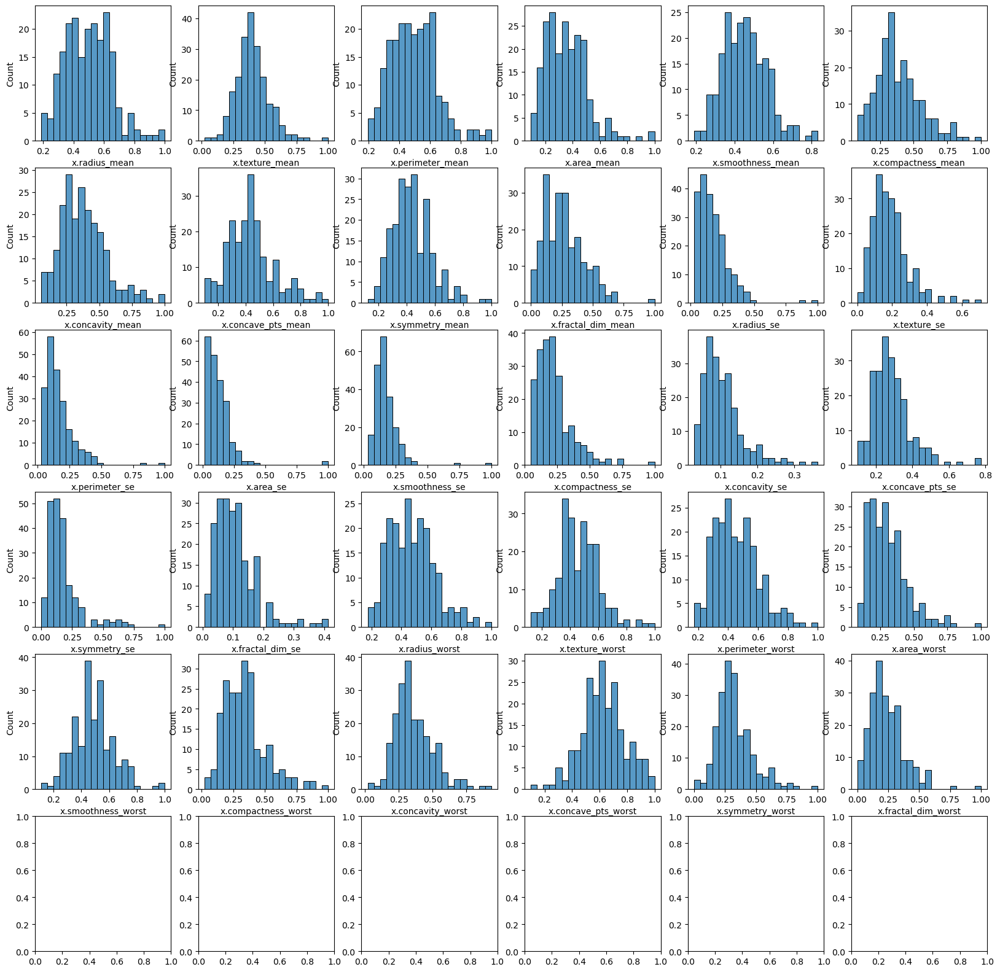

In [57]:
# plot malignant data's distributions
num_rows = 6
num_cols = 6
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20,20))

mal_data = bd_norm[bd_norm['is_malignant'] == 1]
mal_data = mal_data.drop(columns=['is_malignant'])

itr = 0
for label, content in mal_data.items():
    row = itr // num_cols
    col = itr % num_rows
    sb.histplot(data=mal_data, x=label, ax=axes[row, col], bins=20, label=label)
    itr += 1

plt.savefig('mal_data_dist.png')
plt.show()

In [11]:
sb.pairplot(breast_data)

C:\Users\ethch\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\ethch\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\ethch\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\ethch\anaconda3\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

In [17]:
se_cols = ["x.radius_se", "x.texture_se", \
           "x.perimeter_se", "x.area_se", \
           "x.smoothness_se", "x.compactness_se", \
           "x.concavity_se", "x.concave_pts_se", \
           "x.fractal_dim_se"]

no_se_brca = breast_data.drop(columns=se_cols)
no_se_brca

,x.radius_mean,x.texture_mean,x.perimeter_mean,x.area_mean,x.smoothness_mean,x.compactness_mean,x.concavity_mean,x.concave_pts_mean,x.symmetry_mean,x.fractal_dim_mean,...,x.perimeter_worst,x.area_worst,x.smoothness_worst,x.compactness_worst,x.concavity_worst,x.concave_pts_worst,x.symmetry_worst,x.fractal_dim_worst,B,M
0,13.540,14.36,87.46,566.3,0.09779,0.08129,0.06664,0.047810,0.1885,0.05766,...,99.70,711.2,0.14400,0.17730,0.23900,0.12880,0.2977,0.07259,True,False
1,13.080,15.71,85.63,520.0,0.10750,0.12700,0.04568,0.031100,0.1967,0.06811,...,96.09,630.5,0.13120,0.27760,0.18900,0.07283,0.3184,0.08183,True,False
2,9.504,12.44,60.34,273.9,0.10240,0.06492,0.02956,0.020760,0.1815,0.06905,...,65.13,314.9,0.13240,0.11480,0.08867,0.06227,0.2450,0.07773,True,False
3,13.030,18.42,82.61,523.8,0.08983,0.03766,0.02562,0.029230,0.1467,0.05863,...,84.46,545.9,0.09701,0.04619,0.04833,0.05013,0.1987,0.06169,True,False
4,8.196,16.84,51.71,201.9,0.08600,0.05943,0.01588,0.005917,0.1769,0.06503,...,57.26,242.2,0.12970,0.13570,0.06880,0.02564,0.3105,0.07409,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,20.920,25.09,143.00,1347.0,0.10990,0.22360,0.31740,0.147400,0.2149,0.06879,...,179.10,1819.0,0.14070,0.41860,0.65990,0.25420,0.2929,0.09873,False,True
565,21.560,22.39,142.00,1479.0,0.11100,0.11590,0.24390,0.138900,0.1726,0.05623,...,166.10,2027.0,0.14100,0.21130,0.41070,0.22160,0.2060,0.07115,False,True
566,20.130,28.25,131.20,1261.0,0.09780,0.10340,0.14400,0.097910,0.1752,0.05533,...,155.00,1731.0,0.11660,0.19220,0.32150,0.16280,0.2572,0.06637,False,True
567,16.600,28.08,108.30,858.1,0.08455,0.10230,0.09251,0.053020,0.1590,0.05648,...,126.70,1124.0,0.11390,0.30940,0.34030,0.14180,0.2218,0.07820,False,True
